# MRI Tumor Detection with Deep Learning

Welcome to this Jupyter Notebook dedicated to the development of an advanced MRI-based brain tumor detection model. In the rapidly evolving landscape of healthcare, Artificial Intelligence (AI) is playing a pivotal role in transforming various facets of medical diagnosis and treatment. This project focuses on harnessing the power of deep learning to enhance the speed and accuracy of detecting and localizing brain tumors in MRI scans.

## Project Overview

In collaboration with a leading medical diagnosis company in New York City, we are on a mission to revolutionize cancer diagnosis, particularly in the early detection of brain tumors. The significance of this endeavor lies in the potential to reduce the cost of cancer diagnosis and, more importantly, save lives through timely intervention.

## Key Objectives

Our primary task is to develop a robust deep learning model capable of efficiently detecting and localizing brain tumors in MRI scans. To achieve this, we have been provided with a dataset consisting of 3929 brain MRI scans, each annotated with the location of the tumor. The proposed solution involves the implementation of a layered deep learning pipeline, incorporating both classification and segmentation techniques.

## Architecture Overview

The architecture we'll be leveraging comprises two essential components:
- **ResNet Deep Learning Classifier Model:** This component is designed to classify MRI scans as either having or not having a brain tumor. Residual Neural Networks (ResNets) are employed to overcome challenges associated with vanishing gradients, ensuring effective training even with deep architectures.
- **ResUNet Segmentation Model:** The segmentation model, based on the ResUNet architecture, enables pixel-level localization of tumors. This involves understanding and extracting information from images at the pixel level, providing detailed masks that pinpoint tumor locations.

## Transfer Learning

To expedite the training process and capitalize on existing knowledge, we will be employing transfer learning. This technique involves repurposing a pre-trained model, specifically ResNet, for our brain tumor detection task. Transfer learning offers advantages such as faster training progress and the ability to achieve remarkable results with a relatively small training dataset.

## Getting Started

Before diving into the implementation, ensure you have the necessary dependencies installed. Additionally, familiarize yourself with the provided dataset and the project's structure. The full list of startups and resources mentioned in this document can be referred to for further insights.

Let's embark on this journey to leverage AI and cutting-edge technologies to contribute to the early diagnosis and effective management of brain tumors. Together, with AI and bright minds, we aim to eliminate diseases and make a lasting impact on healthcare.


# Dependencies

To kick off our MRI Tumor Detection project, let's ensure we have all the necessary libraries and frameworks installed. Below are the key dependencies we'll be utilizing for data manipulation, visualization, and deep learning implementation:


Ensure that you have the required packages installed to seamlessly execute the subsequent code cells. If any libraries are missing, you can install them using `!pip install <package_name>` in a code cell within your Jupyter Notebook or Google Colab environment.


In [ ]:
# Core Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
import tensorflow as tf
from skimage import io

# TensorFlow/Keras
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as K
from tensorflow.keras.regularizers import l2

# Scikit-learn
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, confusion_matrix,classification_report, precision_score, recall_score, f1_score, roc_curve, auc)

# Data Augmentation
try:
    import albumentations as A
    print("✓ Albumentations loaded for advanced augmentation")
except ImportError:
    print("⚠ Install albumentations for enhanced augmentation: pip install albumentations")

# Other utilities
from IPython.display import display
import os
import glob
import random
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

# GPU Configuration
print(f"TensorFlow version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")

# Enable mixed precision for faster training (if supported)
try:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')
    print("✓ Mixed precision enabled")
except:
    print("⚠ Mixed precision not available")

%matplotlib inline

✓ Albumentations loaded for advanced augmentation
TensorFlow version: 2.20.0
GPU Available: []
✓ Mixed precision enabled


Loading the dataset into brain_df variable

In [4]:
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv('data_mask.csv')
brain_df.head()


,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [4]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


The code brain_df['mask'].value_counts().index is used to retrieve the unique values of the 'mask' column in the DataFrame brain_df, along with their respective counts. This is valuable for understanding the distribution of different categories or classes within the 'mask' column.

In [5]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

Use plotly to plot interactive bar chart


In [6]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 7, opacity = 0.6)
fig.show()

In [7]:
brain_df.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

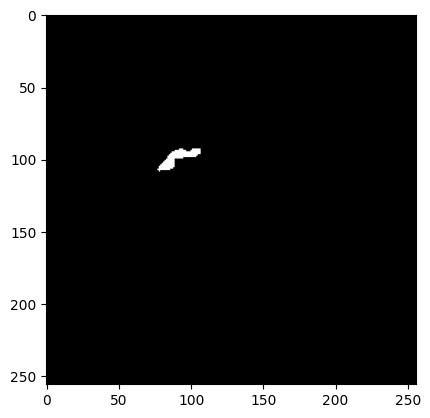

In [8]:
plt.imshow(cv2.imread(brain_df.mask_path[623]))
# brain_df.mask_path[623]

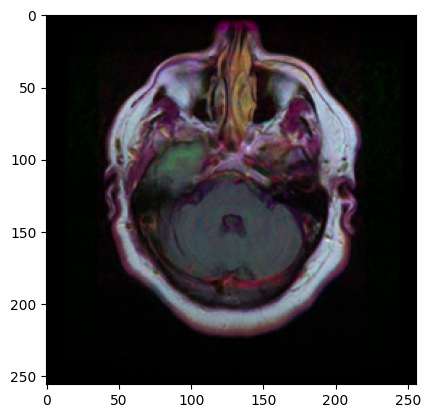

In [9]:
plt.imshow(cv2.imread(brain_df.image_path[623]))

In [10]:
cv2.imread(brain_df.mask_path[623]).max()

np.uint8(255)

In [11]:
cv2.imread(brain_df.mask_path[623]).min()

np.uint8(0)

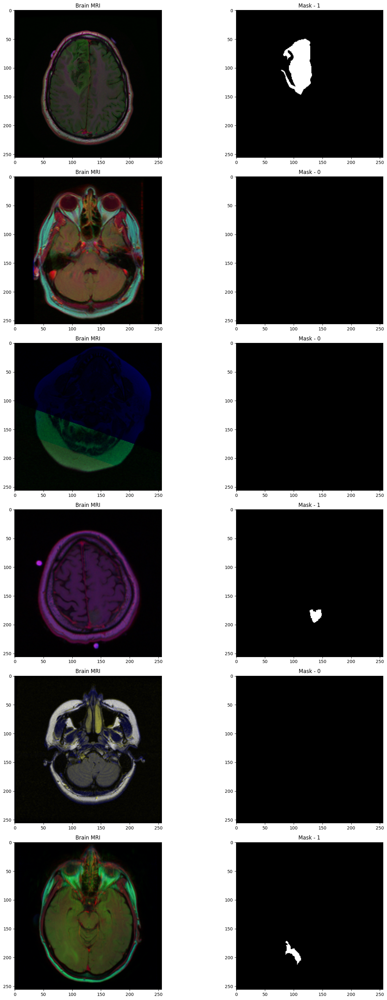

In [12]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately 
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI 
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

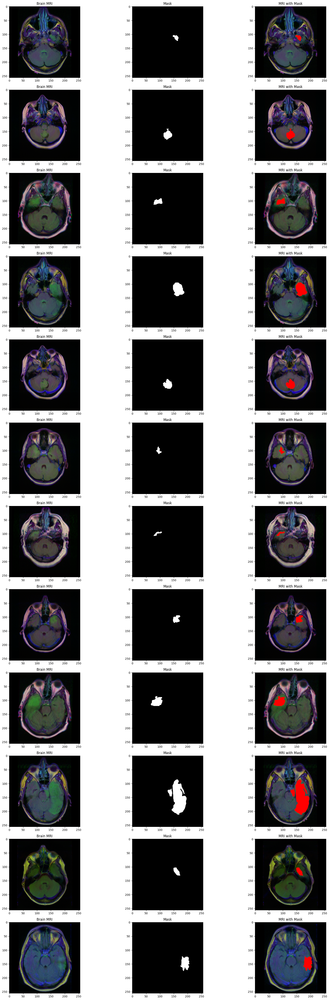

In [13]:
count = 0
fig, axs = plt.subplots(12, 3, figsize = (20, 50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] ==1 and count <12:
    img = io.imread(brain_df.image_path[i])
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].imshow(img)

    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')

    
    img[mask == 255] = (255, 0, 0)
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()


In [6]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [7]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.

brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [8]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [17]:
# Enhanced Image Data Generator with Advanced Augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Training data generator with comprehensive augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255.,
    validation_split=0.15,
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='constant',
    cval=0
)

# Validation generator (no augmentation, only rescaling)
valid_datagen = ImageDataGenerator(
    rescale=1./255.,
    validation_split=0.15
)

In [18]:
# Create data generators with optimized batch size
BATCH_SIZE = 16
IMG_SIZE = (256, 256)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train,
    directory='./',
    x_col='image_path',
    y_col='mask',
    subset="training",
    batch_size=BATCH_SIZE,
    shuffle=True,
    class_mode="categorical",
    target_size=IMG_SIZE
)

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=train,
    directory='./',
    x_col='image_path',
    y_col='mask',
    subset="validation",
    batch_size=BATCH_SIZE,
    shuffle=False,
    class_mode="categorical",
    target_size=IMG_SIZE
)

# Test generator (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255.)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test,
    directory='./',
    x_col='image_path',
    y_col='mask',
    batch_size=BATCH_SIZE,
    shuffle=False,
    class_mode='categorical',
    target_size=IMG_SIZE
)

print(f"\n📊 Dataset Summary:")
print(f"  Training samples: {train_generator.n}")
print(f"  Validation samples: {valid_generator.n}")
print(f"  Test samples: {test_generator.n}")

Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.

📊 Dataset Summary:
  Training samples: 2839
  Validation samples: 500
  Test samples: 590


In [19]:
# Get the ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [20]:
basemodel.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [21]:
# Freeze base model layers initially (for transfer learning)
# We'll unfreeze later for fine-tuning

for layer in basemodel.layers:
    layer.trainable = False

# Verify frozen layers
trainable_count = sum([1 for layer in basemodel.layers if layer.trainable])
non_trainable_count = sum([1 for layer in basemodel.layers if not layer.trainable])
print(f"✓ Frozen layers: {non_trainable_count}")
print(f"✓ Trainable layers: {trainable_count}")

✓ Frozen layers: 175
✓ Trainable layers: 0


In [22]:
# Enhanced Classification Head with Regularization
# Using L2 regularization and BatchNormalization for better generalization

headmodel = basemodel.output
headmodel = GlobalAveragePooling2D()(headmodel)

# First dense block
headmodel = Dense(512, kernel_regularizer=l2(0.001))(headmodel)
headmodel = BatchNormalization()(headmodel)
headmodel = Activation('relu')(headmodel)
headmodel = Dropout(0.4)(headmodel)

# Second dense block
headmodel = Dense(256, kernel_regularizer=l2(0.001))(headmodel)
headmodel = BatchNormalization()(headmodel)
headmodel = Activation('relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)

# Third dense block (additional for better feature extraction)
headmodel = Dense(128, kernel_regularizer=l2(0.001))(headmodel)
headmodel = BatchNormalization()(headmodel)
headmodel = Activation('relu')(headmodel)
headmodel = Dropout(0.2)(headmodel)

# Output layer
headmodel = Dense(2, activation='softmax')(headmodel)

model = Model(inputs=basemodel.input, outputs=headmodel)

print(f"✓ Model built with {model.count_params():,} total parameters")

✓ Model built with 24,804,866 total parameters


In [23]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 24,804,866 (94.62 MB)

 Trainable params: 1,215,362 (4.64 MB)

 Non-trainable params: 23,589,504 (89.99 MB)

In [24]:
# Compile model with optimized settings
# Using label smoothing to prevent overconfident predictions

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    optimizer=optimizer,
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc')
    ]
)

print("✓ Model compiled with label smoothing and comprehensive metrics")

✓ Model compiled with label smoothing and comprehensive metrics


In [25]:
# Enhanced Callbacks for Better Training

# Early stopping with restoration of best weights
earlystopping = EarlyStopping(
    monitor='val_loss',
    mode='min',
    verbose=1,
    patience=15,
    restore_best_weights=True
)

# Save best model based on validation accuracy (using .keras format for TF 2.x)
checkpointer = ModelCheckpoint(
    filepath="classifier-resnet-weights.keras",
    monitor='val_accuracy',
    mode='max',
    verbose=1,
    save_best_only=True
)

# Learning rate scheduler - reduce LR when validation loss plateaus
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

# Combined callbacks
callbacks = [earlystopping, checkpointer, reduce_lr]

print("✓ Callbacks configured:")
print("  - Early stopping (patience=15)")
print("  - Model checkpoint (save best)")
print("  - Learning rate reduction on plateau")

✓ Callbacks configured:
  - Early stopping (patience=15)
  - Model checkpoint (save best)
  - Learning rate reduction on plateau


In [26]:
# Phase 1: Train with frozen base model
# This is a demo with 1 epoch - increase for production training

EPOCHS_PHASE1 = 1  # Set to 30-50 for actual training

print("🚀 Phase 1: Training classification head (base model frozen)")
print("=" * 60)

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.n // BATCH_SIZE,
    epochs=EPOCHS_PHASE1,
    validation_data=valid_generator,
    validation_steps=valid_generator.n // BATCH_SIZE,
    callbacks=callbacks,
    verbose=1
)

print("\n✓ Phase 1 training complete!")

🚀 Phase 1: Training classification head (base model frozen)
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6152 - auc: 0.6530 - loss: 1.9982 - precision: 0.6149 - recall: 0.6145
Epoch 1: val_accuracy improved from None to 0.67540, saving model to classifier-resnet-weights.keras
177/177 ━━━━━━━━━━━━━━━━━━━━ 555s 3s/step - accuracy: 0.6543 - auc: 0.7146 - loss: 1.8428 - precision: 0.6540 - recall: 0.6536 - val_accuracy: 0.6754 - val_auc: 0.7613 - val_loss: 1.6055 - val_precision: 0.6754 - val_recall: 0.6754 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 1.

✓ Phase 1 training complete!


In [ ]:
# Phase 2: Fine-tuning - Unfreeze top layers of base model
# This allows the model to adapt pre-trained features to our specific task

# Unfreeze the last 50 layers of ResNet50
for layer in basemodel.layers[-50:]:
    layer.trainable = True

# Recompile with lower learning rate for fine-tuning
model.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # Lower LR for fine-tuning
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc')
    ]
)

EPOCHS_PHASE2 = 1  # Set to 20-30 for actual training

print("\n🚀 Phase 2: Fine-tuning (top 50 layers unfrozen)")
print("=" * 60)

history_finetune = model.fit(
    train_generator,
    steps_per_epoch=train_generator.n // BATCH_SIZE,
    epochs=EPOCHS_PHASE2,
    validation_data=valid_generator,
    validation_steps=valid_generator.n // BATCH_SIZE,
    callbacks=callbacks,
    verbose=1
)

print("\n✓ Fine-tuning complete!")


🚀 Phase 2: Fine-tuning (top 50 layers unfrozen)
  7/177 ━━━━━━━━━━━━━━━━━━━━ 8:40:36 184s/step - accuracy: 0.6221 - auc: 0.6643 - loss: 1.7726 - precision: 0.6221 - recall: 0.6221

In [ ]:
# Training and Validation Accuracy/Loss Curves

plt.figure(figsize=(12,5))

# Accuracy Curve
plt.subplot(1,2,1)

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

plt.title("Training vs Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Loss Curve
plt.subplot(1,2,2)

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.title("Training vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [27]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json)

In [9]:
# Load pretrained model using legacy approach for compatibility
# The model was saved with older Keras version, so we rebuild the architecture

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Rebuild the ResNet50-based classification model
basemodel = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(256, 256, 3)))

# Freeze base model
for layer in basemodel.layers:
    layer.trainable = False

# Build classification head (matching original architecture)
headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size=(4, 4))(headmodel)
headmodel = Flatten()(headmodel)
headmodel = Dense(256, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation='softmax')(headmodel)

model = Model(inputs=basemodel.input, outputs=headmodel)

# Load the pre-trained weights
model.load_weights('weights.hdf5')
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

print("✓ Classification model loaded successfully!")
print(f"  Total parameters: {model.count_params():,}")

✓ Classification model loaded successfully!
  Total parameters: 25,685,634


In [28]:
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step


In [29]:
test_predict

array([[0.000e+00, 1.000e+00],
       [1.000e+00, 8.941e-07],
       [1.000e+00, 3.678e-05],
       ...,
       [2.201e-04, 1.000e+00],
       [3.594e-05, 1.000e+00],
       [1.000e+00, 2.086e-06]], shape=(576, 2), dtype=float16)

In [30]:
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [31]:
predict

array(['1', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '0', '1', '0', '1', '1', '1',
       '0', '0', '0', '1', '0', '0', '1', '0', '0', '1', '0', '1', '1',
       '0', '1', '1', '0', '0', '1', '1', '0', '0', '0', '0', '1', '0',
       '1', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0', '0', '0',
       '1', '1', '0', '0', '1', '1', '1', '1', '0', '0', '1', '0', '1',
       '0', '0', '1', '0', '1', '1', '1', '1', '0', '1', '1', '0', '0',
       '0', '1', '1', '1', '1', '0', '1', '1', '0', '0', '1', '1', '0',
       '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '1', '0',
       '1', '1', '0', '1', '1', '0', '0', '1', '1', '1', '0', '1', '1',
       '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '1', '0', '1', '0', '1', '0', '1', '1', '1', '0',
       '1', '0', '0', '0', '1', '1', '1', '0', '1', '0', '1', '0', '0',
       '0', '0', '0', '0', '0', '1', '0', '1', '0', '0', '0', '0

In [32]:
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

In [33]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.9791666666666666

<Axes: >

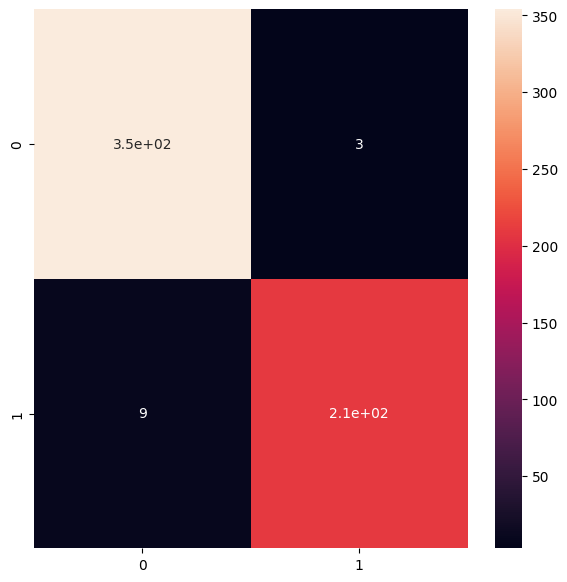

In [ ]:
# Enhanced Confusion Matrix

cm = confusion_matrix(original, predict)

plt.figure(figsize=(8,6))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=['No Tumor', 'Tumor'],
    yticklabels=['No Tumor', 'Tumor']
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [35]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       357
           1       0.99      0.96      0.97       219

   micro avg       0.98      0.98      0.98       576
   macro avg       0.98      0.98      0.98       576
weighted avg       0.98      0.98      0.98       576



In [36]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [ ]:
# Enhanced Performance Metrics Dashboard

accuracy = accuracy_score(original, predict)
precision = precision_score(original, predict, average='weighted')
recall = recall_score(original, predict, average='weighted')
f1 = f1_score(original, predict, average='weighted')

metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
})

print(metrics_df)

plt.figure(figsize=(8,5))

sns.barplot(
    x='Metric',
    y='Score',
    data=metrics_df
)

plt.ylim(0,1)
plt.title("Classification Performance Metrics")
plt.show()

In [ ]:
# ROC Curve

predict_probs = test_predict[:,1]

fpr, tpr, thresholds = roc_curve(original, predict_probs)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8,6))

plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.4f}')

plt.plot([0,1], [0,1], linestyle='--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()

plt.show()

# Multi-Level Tumor Classification (Issue #83)

The classifier above answers a binary question — *is a tumour present?*. The cells
below extend that into a **three-level hierarchy** implemented in
`multilevel_classifier.py`:

| Level | Builder | Output classes |
|------:|---------|----------------|
| 1 | `build_tumor_type_classifier`  | glioma · meningioma · notumor · pituitary |
| 2 | `build_glioma_grade_classifier`| LGG · HGG *(gliomas only)* |
| 3 | `build_tumor_stage_classifier` | WHO grade I–IV *(gliomas only)* |

`MultiLevelTumorClassifier` cascades these models and **short-circuits** exactly
like the detector→segmenter pipeline: if Level 1 returns *notumor* the heavier
sub-models never run, and grade/stage are evaluated only for gliomas. It also
performs confidence gating and a WHO grade↔stage consistency check (LGG⇔I/II,
HGG⇔III/IV).

**Framework parity.** The builders mirror this notebook's Keras conventions
(ResNet50 transfer learning, 256×256 inputs, `rescale=1/255`, the cell-25 head and
cell-27 compile settings) rather than the PyTorch/ResNet18 layout shown in the
private-v3 diagram, so the new models drop straight into the existing pipeline.

**Data note.** TCGA-LGG (`data_mask.csv`) only carries a binary `mask`. Every
tumour slice here is a glioma, so Level 1 is immediately trainable for the
`{glioma, notumor}` subset (next cell). The full 4-class type problem and the
grade/stage levels require an extended, labelled corpus — see
`MULTILEVEL_CLASSIFICATION.md`.

In [ ]:
# Multi-level classification utilities (implemented in multilevel_classifier.py)
from multilevel_classifier import (
    derive_type_labels_from_mask_csv,
    class_weights_from_labels,
    build_tumor_type_classifier,
    build_glioma_grade_classifier,
    build_tumor_stage_classifier,
    compile_classifier,
    build_type_data_generators,
    MultiLevelTumorClassifier,
    TYPE_LABELS, GRADE_LABELS, STAGE_LABELS,
)

# Bootstrap Level-1 labels from the binary mask column.
# TCGA-LGG is all-glioma, so: mask == 1 -> 'glioma', mask == 0 -> 'notumor'.
type_df = derive_type_labels_from_mask_csv(brain_df, mask_col='mask')

print("Derived Level-1 label distribution (this dataset):")
print(type_df['type'].value_counts().to_string())
print("\nFull Level-1 target vocabulary:", TYPE_LABELS)
print("Class weights (balanced):", class_weights_from_labels(type_df['type'].tolist()))

In [ ]:
# Build the three classifiers using this notebook's conventions.
# ResNet50 + ImageNet, 256x256, regularised GAP->Dense head, label-smoothed Adam.
# (Use backbone='custom_cnn' for the lightweight from-scratch type model if you
#  don't have ImageNet weight access.)
type_model  = compile_classifier(build_tumor_type_classifier())          # 4-class
grade_model = compile_classifier(build_glioma_grade_classifier())        # LGG/HGG
stage_model = compile_classifier(build_tumor_stage_classifier(use_attention=True))  # I-IV + SE attention

for name, m in [("type", type_model), ("grade", grade_model), ("stage", stage_model)]:
    print(f"{name:5s} classifier: {m.count_params():,} params  ->  output {m.output_shape}")

In [ ]:
# Optional: train the Level-1 type classifier on the derived {glioma, notumor}
# subset, reusing the same generators/augmentation as the binary classifier.
# Set RUN_MULTILEVEL_TRAINING = True to execute (skipped by default so the
# notebook runs quickly). Grade/stage levels need an extended labelled dataset.
RUN_MULTILEVEL_TRAINING = False

if RUN_MULTILEVEL_TRAINING:
    train_gen, valid_gen = build_type_data_generators(
        type_df, label_col='type', batch_size=BATCH_SIZE, val_split=0.15, augment=True,
    )
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=4, min_lr=1e-7),
        ModelCheckpoint('tumor-type-weights.keras', monitor='val_accuracy', save_best_only=True),
    ]
    cw = class_weights_from_labels(type_df['type'].tolist())
    history_type = type_model.fit(
        train_gen, validation_data=valid_gen, epochs=30,
        class_weight=cw, callbacks=callbacks,
    )

    # Persist the architecture alongside the existing model JSONs (cell-32 pattern).
    with open('tumor-type-model.json', 'w') as f:
        f.write(type_model.to_json())
    print("✓ Level-1 type classifier trained and saved")
else:
    print("Skipping multi-level training (set RUN_MULTILEVEL_TRAINING = True to enable).")

In [ ]:
# Assemble the cascade and run hierarchical inference on a sample slice.
# With trained weights this yields type -> (grade, stage); with freshly-built
# weights it still demonstrates the routing, confidence gating and output schema.
ml_classifier = MultiLevelTumorClassifier(type_model, grade_model, stage_model)

sample_path = type_df[type_df['type'] == 'glioma']['image_path'].iloc[0]
sample_img = cv2.imread(sample_path)

result = ml_classifier.predict(sample_img, preprocess=True)

import json as _json
print(f"Sample: {sample_path}\n")
print(_json.dumps(result.to_dict(), indent=2))

### Extending to the full hierarchy

To unlock all four Level-1 classes and the grade/stage levels, add the relevant
labelled data and point the same builders at it:

- **Type (4-class)** — combine TCGA-LGG with a meningioma/pituitary/notumor source
  (e.g. the *Brain Tumor MRI Dataset*), build a `type` column over all four labels,
  then `build_type_data_generators(df, label_col='type')`.
- **Grade (LGG/HGG)** — join TCGA glioma-grade clinical metadata (or use a BraTS
  LGG/HGG split) to add a `grade` column, then train `grade_model`.
- **Stage (WHO I–IV)** — requires per-case WHO grade annotations; train `stage_model`
  on the labelled subset.

The orchestrator and decision logic are dataset-agnostic — only the per-level
training data changes. See `MULTILEVEL_CLASSIFICATION.md` for the full schema,
dataset pointers and serving notes.

In [37]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [38]:
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [39]:
# Enhanced Data Generators for Segmentation
from utilities import DataGenerator, EnhancedDataGenerator

# Training generator WITH augmentation
training_generator = DataGenerator(
    train_ids, 
    train_mask,
    batch_size=16,
    augment=True  # Enable augmentation for training
)

# Validation generator WITHOUT augmentation
validation_generator = DataGenerator(
    val_ids, 
    val_mask,
    batch_size=16,
    augment=False  # No augmentation for validation
)

print(f"✓ Data generators created")
print(f"  Training batches: {len(training_generator)}")
print(f"  Validation batches: {len(validation_generator)}")

✓ Data generators created
  Training batches: 72
  Validation batches: 6


In [40]:
# Enhanced ResBlock with SE (Squeeze-and-Excitation) Attention
# This improves feature recalibration and model performance

def squeeze_excite_block(input_tensor, ratio=16):
    """
    Squeeze-and-Excitation block for channel attention.
    Helps the model focus on important features.
    """
    filters = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Dense(filters // ratio, activation='relu')(se)
    se = Dense(filters, activation='sigmoid')(se)
    se = Reshape([1, 1, filters])(se)
    return Multiply()([input_tensor, se])

def resblock(X, f, use_se=True):
    """
    Enhanced Residual Block with optional SE attention.
    
    Args:
        X: Input tensor
        f: Number of filters
        use_se: Whether to use Squeeze-and-Excitation attention
    """
    X_copy = X

    # Main path
    X = Conv2D(f, kernel_size=(1, 1), strides=(1, 1), 
               kernel_initializer='he_normal', padding='same')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)

    X = Conv2D(f, kernel_size=(3, 3), strides=(1, 1), 
               padding='same', kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)

    # Short path
    X_copy = Conv2D(f, kernel_size=(1, 1), strides=(1, 1), 
                    kernel_initializer='he_normal', padding='same')(X_copy)
    X_copy = BatchNormalization()(X_copy)

    # Add paths
    X = Add()([X, X_copy])
    X = Activation('relu')(X)
    
    # Apply SE attention
    if use_se:
        X = squeeze_excite_block(X)

    return X

print("✓ Enhanced ResBlock with SE attention defined")

✓ Enhanced ResBlock with SE attention defined


In [41]:
# Enhanced upsampling with attention gates for better skip connections

def attention_gate(x, g, inter_channels):
    """
    Attention Gate: Focuses on relevant features during upsampling.
    Improves segmentation accuracy for small tumors.
    
    Args:
        x: Skip connection features
        g: Gating signal (from decoder)
        inter_channels: Number of intermediate channels
    """
    theta_x = Conv2D(inter_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    phi_g = Conv2D(inter_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(g)
    
    f = Activation('relu')(Add()([theta_x, phi_g]))
    psi_f = Conv2D(1, kernel_size=(1, 1), strides=(1, 1), padding='same')(f)
    rate = Activation('sigmoid')(psi_f)
    
    return Multiply()([x, rate])

def upsample_concat(x, skip, use_attention=True):
    """
    Upsampling with optional attention-guided skip connections.
    
    Args:
        x: Input tensor from decoder
        skip: Skip connection from encoder
        use_attention: Whether to apply attention gates
    """
    x = UpSampling2D((2, 2))(x)
    
    if use_attention:
        skip = attention_gate(skip, x, skip.shape[-1] // 2)
    
    merge = Concatenate()([x, skip])
    return merge

print("✓ Attention-guided upsampling defined")

✓ Attention-guided upsampling defined


In [42]:
# Enhanced ResUNet with Attention and Deep Supervision
# Architecture optimized for brain tumor segmentation

input_shape = (256, 256, 3)
X_input = Input(input_shape)

# ============== ENCODER ==============
# Stage 1: Initial convolution block
conv1_in = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size=(2, 2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 64)
pool_2 = MaxPool2D(pool_size=(2, 2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 128)
pool_3 = MaxPool2D(pool_size=(2, 2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 256)
pool_4 = MaxPool2D(pool_size=(2, 2))(conv4_in)

# ============== BOTTLENECK ==============
# Stage 5: Bridge with dilated convolutions for larger receptive field
conv5_in = resblock(pool_4, 512)
conv5_in = Conv2D(512, 3, padding='same', dilation_rate=2, kernel_initializer='he_normal')(conv5_in)
conv5_in = BatchNormalization()(conv5_in)
conv5_in = Activation('relu')(conv5_in)

# ============== DECODER ==============
# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in, use_attention=True)
up_1 = resblock(up_1, 256)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in, use_attention=True)
up_2 = resblock(up_2, 128)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in, use_attention=True)
up_3 = resblock(up_3, 64)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in, use_attention=True)
up_4 = resblock(up_4, 32)

# ============== OUTPUT ==============
# Final convolution with dropout for regularization
output = Dropout(0.3)(up_4)
output = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(output)

model_seg = Model(inputs=X_input, outputs=output)

print("✓ Enhanced Attention ResUNet built")
print(f"  Total parameters: {model_seg.count_params():,}")

✓ Enhanced Attention ResUNet built
  Total parameters: 7,368,303


In [43]:
model_seg.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      2,112 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ activation_3[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │      2,112 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 128, 128,  │          0 │ add[0][0]         │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ activation_4[0][… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 4)         │        260 │ global_average_p

 Total params: 7,368,303 (28.11 MB)

 Trainable params: 7,358,511 (28.07 MB)

 Non-trainable params: 9,792 (38.25 KB)

In [44]:
# from utilities import focal_tversky, tversky_loss, tversky
from utilities import focal_tversky, tversky_loss,tversky

In [10]:
# Reload utilities module to pick up fixed functions
import importlib
import utilities
importlib.reload(utilities)
from utilities import (
    focal_tversky, tversky_loss, tversky,
    dice_coefficient, dice_loss, bce_dice_loss,
    iou_score, sensitivity, specificity, combo_loss
)
print("✓ Utilities reloaded with mixed precision fixes")

✓ Utilities reloaded with mixed precision fixes


In [46]:
# Import enhanced loss functions and metrics
from utilities import (
    focal_tversky, tversky_loss, tversky,
    dice_coefficient, dice_loss, bce_dice_loss,
    iou_score, sensitivity, specificity, combo_loss
)

# Compile with advanced optimizer and multiple metrics
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model_seg.compile(
    optimizer=optimizer,
    loss=focal_tversky,
    metrics=[
        tversky,
        dice_coefficient,
        iou_score,
        sensitivity,
        specificity
    ]
)

print("✓ Segmentation model compiled with comprehensive metrics:")
print("  - Loss: Focal Tversky (α=0.7, γ=0.75)")
print("  - Metrics: Tversky, Dice, IoU, Sensitivity, Specificity")

✓ Segmentation model compiled with comprehensive metrics:
  - Loss: Focal Tversky (α=0.7, γ=0.75)
  - Metrics: Tversky, Dice, IoU, Sensitivity, Specificity


In [47]:
# Enhanced callbacks for segmentation training

# Early stopping with longer patience for segmentation
earlystopping_seg = EarlyStopping(
    monitor='val_loss',
    mode='min',
    verbose=1,
    patience=20,
    restore_best_weights=True
)

# Save best model based on Dice coefficient
checkpointer_seg = ModelCheckpoint(
    filepath="ResUNet-weights.keras",
    monitor='val_dice_coefficient',
    mode='max',
    verbose=1,
    save_best_only=True
)

# Learning rate scheduler
reduce_lr_seg = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=7,
    min_lr=1e-7,
    verbose=1
)

callbacks_seg = [earlystopping_seg, checkpointer_seg, reduce_lr_seg]

print("✓ Segmentation callbacks configured")

✓ Segmentation callbacks configured


In [48]:
# Train segmentation model
# Using 1 epoch for demo - increase to 50-100 for production

EPOCHS_SEG = 1  # Set to 50-100 for actual training

print("🚀 Training Segmentation Model (ResUNet with Attention)")
print("=" * 60)

history_seg = model_seg.fit(
    training_generator,
    epochs=EPOCHS_SEG,
    validation_data=validation_generator,
    callbacks=callbacks_seg,
    verbose=1
)

print("\n✓ Segmentation training complete!")

🚀 Training Segmentation Model (ResUNet with Attention)


KeyboardInterrupt: 

In [ ]:
# Segmentation Training Curves

plt.figure(figsize=(12,5))

# Dice Score
plt.subplot(1,2,1)

plt.plot(history_seg.history['dice_coef'], label='Train Dice')
plt.plot(history_seg.history['val_dice_coef'], label='Validation Dice')

plt.title("Dice Coefficient")
plt.xlabel("Epochs")
plt.ylabel("Dice Score")
plt.legend()

# Loss
plt.subplot(1,2,2)

plt.plot(history_seg.history['loss'], label='Train Loss')
plt.plot(history_seg.history['val_loss'], label='Validation Loss')

plt.title("Segmentation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [ ]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("ResUNet-model.json","w") as json_file:
  json_file.write(model_json)

In [11]:
# Load pretrained segmentation model
# Import custom loss functions from utilities
from utilities import focal_tversky, tversky_loss, tversky

# Rebuild ResUNet architecture to match saved weights
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

def build_resunet(input_shape=(256, 256, 3)):
    """Rebuild the ResUNet model architecture."""
    
    def resblock(X, f):
        X_copy = X
        X = Conv2D(f, kernel_size=(1,1), strides=(1,1), kernel_initializer='he_normal')(X)
        X = BatchNormalization()(X)
        X = Activation('relu')(X)
        X = Conv2D(f, kernel_size=(3,3), strides=(1,1), padding='same', kernel_initializer='he_normal')(X)
        X = BatchNormalization()(X)
        X_copy = Conv2D(f, kernel_size=(1,1), strides=(1,1), kernel_initializer='he_normal')(X_copy)
        X_copy = BatchNormalization()(X_copy)
        X = Add()([X, X_copy])
        X = Activation('relu')(X)
        return X
    
    def upsample_concat(x, skip):
        x = UpSampling2D((2,2))(x)
        merge = Concatenate()([x, skip])
        return merge
    
    X_input = Input(input_shape)
    
    # Encoder
    conv1_in = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(X_input)
    conv1_in = BatchNormalization()(conv1_in)
    conv1_in = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1_in)
    conv1_in = BatchNormalization()(conv1_in)
    pool_1 = MaxPool2D(pool_size=(2,2))(conv1_in)
    
    conv2_in = resblock(pool_1, 32)
    pool_2 = MaxPool2D(pool_size=(2,2))(conv2_in)
    
    conv3_in = resblock(pool_2, 64)
    pool_3 = MaxPool2D(pool_size=(2,2))(conv3_in)
    
    conv4_in = resblock(pool_3, 128)
    pool_4 = MaxPool2D(pool_size=(2,2))(conv4_in)
    
    conv5_in = resblock(pool_4, 256)
    
    # Decoder
    up_1 = upsample_concat(conv5_in, conv4_in)
    up_1 = resblock(up_1, 128)
    
    up_2 = upsample_concat(up_1, conv3_in)
    up_2 = resblock(up_2, 64)
    
    up_3 = upsample_concat(up_2, conv2_in)
    up_3 = resblock(up_3, 32)
    
    up_4 = upsample_concat(up_3, conv1_in)
    up_4 = resblock(up_4, 16)
    
    output = Conv2D(1, (1,1), padding="same", activation="sigmoid")(up_4)
    
    return Model(inputs=X_input, outputs=output)

# Build and load weights
model_seg = build_resunet()
model_seg.load_weights('weights_seg.hdf5')

# Compile with standard Adam optimizer (Keras 3 compatible)
adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model_seg.compile(optimizer=adam, loss=focal_tversky, metrics=[tversky])

print("✓ Segmentation model loaded successfully!")
print(f"  Total parameters: {model_seg.count_params():,}")

✓ Segmentation model loaded successfully!
  Total parameters: 1,210,513


In [12]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities+ import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

In [13]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17...,"[[[[1.67e-06], [1.7e-06], [4.e-06], [2.56e-06]...",1
1,TCGA_FG_7634_20000128/TCGA_FG_7634_20000128_14...,No mask,0
2,TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_19...,No mask,0
3,TCGA_HT_7860_19960513/TCGA_HT_7860_19960513_11...,No mask,0
4,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_54...,No mask,0
...,...,...,...
585,TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_53...,No mask,0
586,TCGA_DU_6399_19830416/TCGA_DU_6399_19830416_12...,No mask,0
587,TCGA_DU_7309_19960831/TCGA_DU_7309_19960831_10...,No mask,0
588,TCGA_DU_A5TU_19980312/TCGA_DU_A5TU_19980312_17...,"[[[[1.2e-06], [1.9e-06], [4.05e-06], [3.34e-06...",1


In [14]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17...,TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17...,1,"[[[[1.67e-06], [1.7e-06], [4.e-06], [2.56e-06]...",1
1,TCGA_FG_7634_20000128/TCGA_FG_7634_20000128_14...,TCGA_FG_7634_20000128/TCGA_FG_7634_20000128_14...,0,No mask,0
2,TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_19...,TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_19...,0,No mask,0
3,TCGA_HT_7860_19960513/TCGA_HT_7860_19960513_11...,TCGA_HT_7860_19960513/TCGA_HT_7860_19960513_11...,0,No mask,0
4,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_54...,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_54...,0,No mask,0


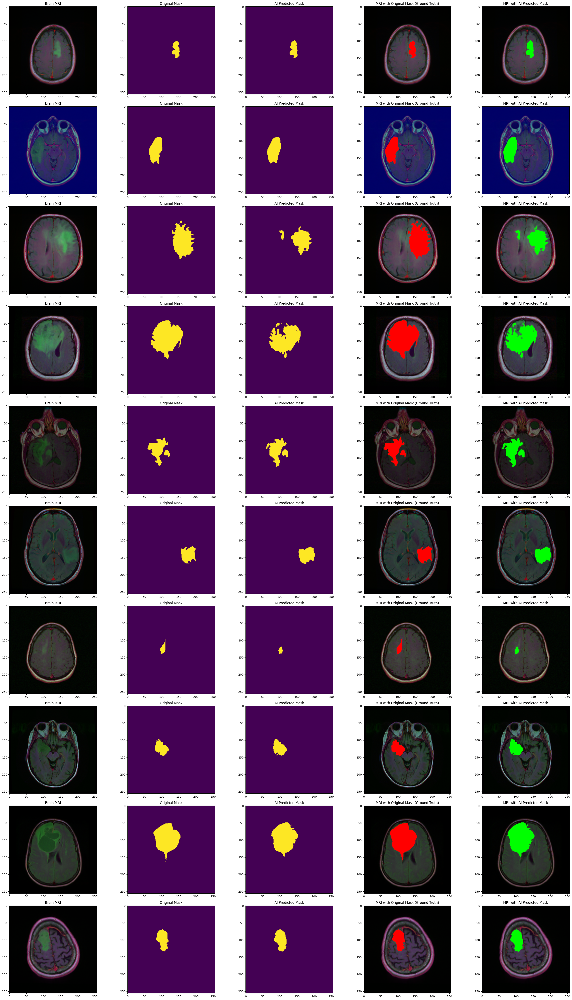

In [15]:
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()

✓ Segmentation predictions saved to images/segmentation_predictions.png


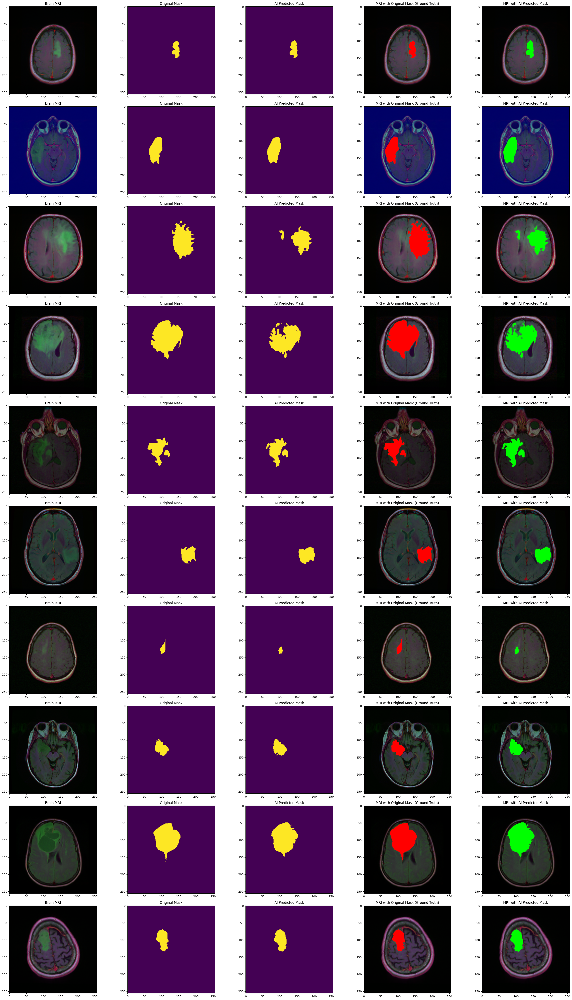

In [16]:
# Save segmentation prediction visualization for README
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()
plt.savefig('images/segmentation_predictions.png', dpi=150, bbox_inches='tight')
print("✓ Segmentation predictions saved to images/segmentation_predictions.png")

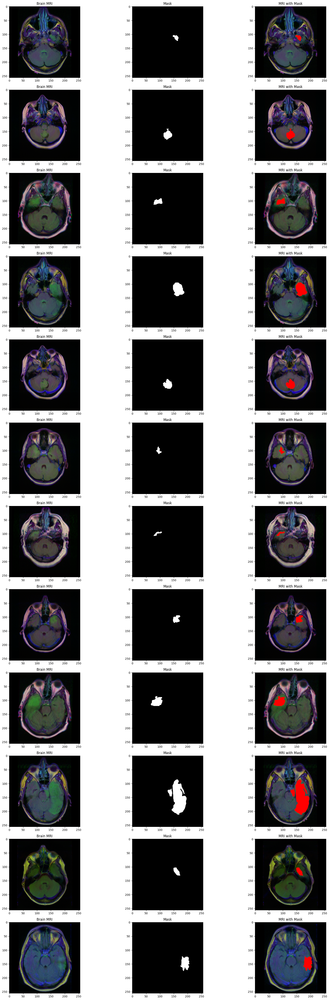

In [17]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image 
count = 0 
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
  # read the images 
    img = io.imread(brain_df.image_path[i])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # obtain the mask for the image 
    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')
    
    # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255 
    img[mask == 255] = (255,0,0)    
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()

✓ Dataset visualization saved to images/dataset_visualization.png


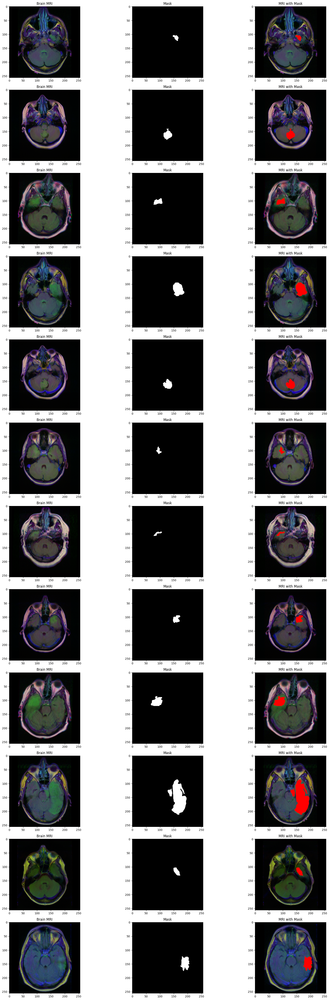

In [18]:
# Save dataset visualization for README
count = 0 
fig, axs = plt.subplots(12, 3, figsize=(20, 50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
    img = io.imread(brain_df.image_path[i])
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap='gray')
    
    img[mask == 255] = (255, 0, 0)    
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()
plt.savefig('images/dataset_visualization.png', dpi=150, bbox_inches='tight')
print("✓ Dataset visualization saved to images/dataset_visualization.png")